In [1]:
%load_ext autoreload
%autoreload 

import os 
import shutil
import numpy as n
from datetime import date
from matplotlib import pyplot as plt
import time
import napari

In [2]:
os.chdir('/home/ali/packages/s2p-lbm/')

from suite3d.job import Job
from suite3d import lbmio, utils, ui
from suite3d.io import get_tif_tag
from suite3d.io import tiff_utils as tfu
from suite3d import file_utils as flu

/home/ali/anaconda3/envs/suite3d-gpu/lib/python3.8/site-packages/paramiko/pkey.py:100: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
/home/ali/anaconda3/envs/suite3d-gpu/lib/python3.8/site-packages/paramiko/transport.py:258: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


In [3]:
from suite3d import nbtools as nbui

In [4]:
subjects_dir =   '/mnt/zortex-subjects/'
expt_info = { 
    'subject':         'SS003',
    'date' :          '2024-08-06',
    'expnum' :         [1,2,3,4]}

tifs, si_params, exp_str = flu.find_exp(subjects_dir, **expt_info, verbose=False)

job_params = {    
    # number of channels recorded in the tiff file, typically 30
    'n_ch_tif' : 26,
    # number of planes in the deeper cavity, typically 15
    'cavity_size' : 13,
    # convert from the Scanimage channel ordering to deep-to-shallow ordering
    # in our case, ScanImage channel numbers are in temporal order. 
    'planes' : n.array([ 0,  2,  4,  6,  8, 10, 12, 14,
                        16, 18, 20, 22, 24, 1,  3, 5,  7,9,11, 13, 15,17,19,21])[n.array([6,7,8,9,10,11,12])],
    # number of files to use for the initial pass
    'n_init_files' :   3,
    
    # number of pixels to fuse between the ROI strips
    # the auto-detection doesn't always work well, recommend 
    # manually tuning it to reduce the stitching artifacts
    'fuse_shift_override' : 7,
    
    # will try to automatically estimate crosstalk using 
    # the shallowest crosstalk_n_planes planes. if you want to override,
    # set override_crosstalk = float between 0 and 1
    'subtract_crosstalk' : False,
    
    # volume rate in acquisition
    'fs' : flu.get_si_params(tifs[0])['vol_rate'],
    
    # 3D GPU registration - fast! 
    # for now, 3D + GPU are well-tested, other options might have minor bugs
    # if you run into them, let us know! we'll fix them
    '3d_reg' : True,
    'gpu_reg' : True,
}


job_params['fs'] = si_params['vol_rate']

savedir = os.path.join('/mnt/md0/runs', expt_info['subject'], expt_info['date'])
os.makedirs(savedir, exist_ok=True)

# Create the job
job = Job('/mnt/md0/runs',exp_str + 'subset', tifs = tifs[:20],
          params=job_params, create=True, overwrite=True, verbosity = 3)

Job directory /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset already exists
Loading job directory for SS003_2024-08-06_1-2-3-4subset in /mnt/md0/runs
   Loading dirs 
      Found dir registered_fused_data
      Found dir summary
      Found dir iters
   Loading default params
      Updating param n_ch_tif
      Updating param cavity_size
      Updating param planes
      Updating param n_init_files
      Updating param fuse_shift_override
      Updating param subtract_crosstalk
      Updating param fs
      Updating param 3d_reg
      Updating param gpu_reg
   Updated main params file


In [5]:
job.params['voxel_size_um'] = (20, 2.5, 2.5)

In [6]:
# %%time
# job.run_init_pass()

In [7]:
img3d = job.load_summary()['ref_img_3d']

(<Figure size 1050x750 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7f67f0146d90>)

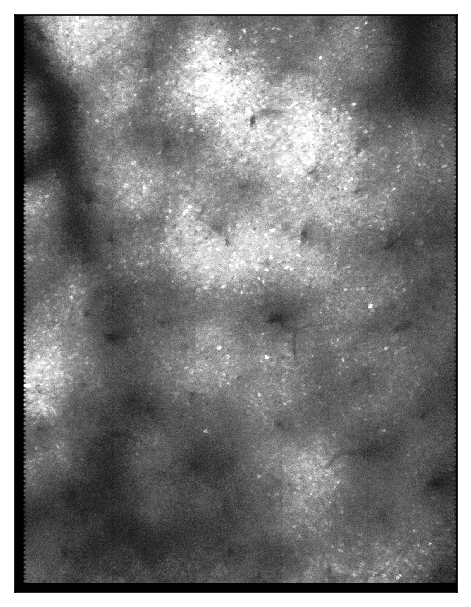

In [8]:
tfu.show_tif(img3d[0], figsize=(7,5))

(<Figure size 2000x500 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

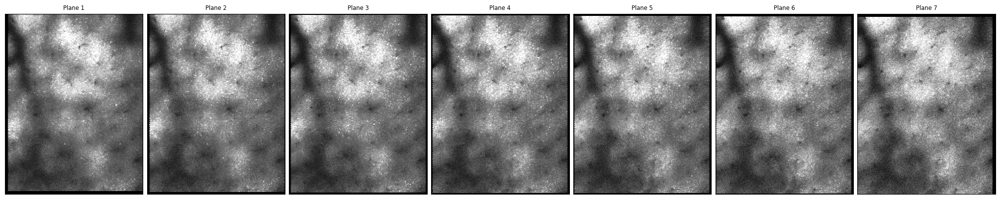

In [9]:
tfu.show_tif_all_planes(img3d, ncols=7, figsize=(20,5))

In [15]:
mov_full = job.get_registered_movie()

In [11]:
reg = job.load_registration_results()

In [12]:
from suite3d import extension as ext

In [13]:
job.dirs['registered_fused_data']

'/mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/registered_fused_data'

In [219]:
mov = mov_full [:,:, 290:590, 312:612,].compute()

In [220]:
img = mov.mean(axis=1)

In [221]:
img.shape

(7, 300, 300)

In [222]:
mov.shape

(7, 2000, 300, 300)

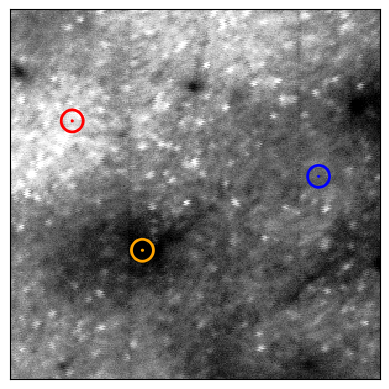

In [223]:
f,ax = plt.subplots()
zidx = 5
tfu.show_tif(img[zidx],ax=ax)

pt_cell = 135, 113
pt_cell = 90, 50
pt_npil = 135, 250
# pt_dark = 190, 100
pt_dark = 195,107

pts = [pt_cell, pt_npil, pt_dark]
colors = 'red', 'blue', 'orange'

for i,pt in enumerate(pts):
    ax.scatter([pt[1],], [pt[0]], color = 'none', edgecolor=colors[i],s=250, lw=2)
    ax.scatter([pt[1],], [pt[0]], color = colors[i], edgecolor='none',s=5, lw=2)

In [ ]:

# scale = 10000
# dy = 2
# for i,pt in enumerate(pts):
#     plt.plot(ts, mov[zidx, :, pt[0], pt[1]]/scale + dy*i, color=colors[i], lw=2)
# plt.xlim(0,100)

# mov_norm.shape


# scale = 0.1
# dy = 2
# for i,pt in enumerate(pts):
#     plt.plot(ts, mov_norm[zidx, :, pt[0], pt[1]]/scale + dy*i, color=colors[i], lw=2)
# plt.xlim(0,100)

In [224]:
ts = n.arange(mov.shape[1]) / job.params['fs']

In [225]:
mov_hpf = mov - mov.mean(axis=1,keepdims=True)

In [226]:
mov_diff = n.diff(mov_hpf,axis=1)

In [228]:
sdnorm = n.sqrt(n.sum(mov_diff**2, axis = 1,keepdims=True))

In [231]:
mov_norm = mov_hpf / sdnorm

In [232]:
from scipy.ndimage import gaussian_filter, uniform_filter

In [233]:
mov3d = n.swapaxes(mov_norm,0,1)

In [ ]:
np_filt = gaussian_filter(mov3d, (0, 1, 20, 20))

mov_sub = mov3d - np_filt

cell_filt = gaussian_filter(mov_sub, (0,0.5,3,3))

stdmap = n.sum(cell_filt**2,axis=0) ** 0.5
threshmap = ext.thresh_mask_corr_map(stdmap, 20)

thresh_val = 0.001
cell_filt_thresh = cell_filt.copy()
cell_filt_thresh[cell_filt_thresh < thresh_val] = n.nan
vmap = n.nansum(cell_filt_thresh**2, axis=0) ** 0.5

vmap_thresh = ext.thresh_mask_corr_map(vmap, 21)

In [393]:
std_mov = mov.std(axis=1)
std_movnorm = mov_norm.std(axis=1)
std_npil = np_filt.std(axis=0)
std_movsub = mov_sub.std(axis=0)

In [394]:
steps = [std_mov, std_movnorm, std_npil, std_movsub, stdmap, vmap, vmap_thresh]
names = ['mov', 'mov_norm', 'mov_npil', 'mov_sub', 'mov_cell', 'vmap', 'vmap_thresh']

In [372]:
from pathlib import Path
fig_dir = Path('/mnt/md0/s3d-figures')
figname = 'fig-corrmap-steps'
fdir = fig_dir / figname
plt.rcParams['svg.fonttype'] = 'none'
os.makedirs(fdir, exist_ok=True)

In [396]:
std_mov.shape

(7, 300, 300)

In [397]:
std_mov.max(axis=(1,2))

array([7272.466 , 6830.7603, 6415.001 , 4983.4443, 4547.904 , 3858.2778,
       3411.7861], dtype=float32)

In [398]:
step = std_mov.copy()

(<Figure size 1200x900 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7f67a5f07190>)

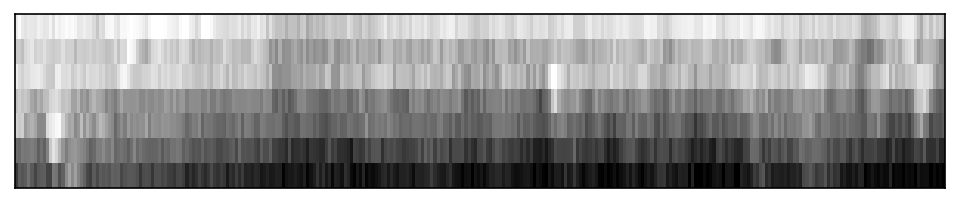

In [400]:
tfu.show_tif(step[:,150], px_py=(2.5,20))

In [401]:
step_eq = step.copy() - step.min(axis=0)

(<Figure size 1200x900 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7f67a5b80d00>)

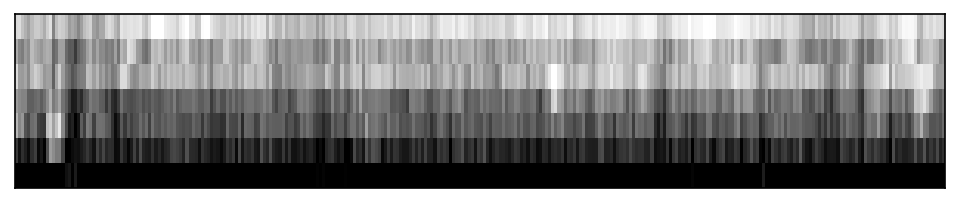

In [403]:
tfu.show_tif(step_eq[:,150], px_py=(2.5,20))

/tmp/ipykernel_117650/2073647415.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f,ax = plt.subplots(figsize=(5,5), dpi=200)


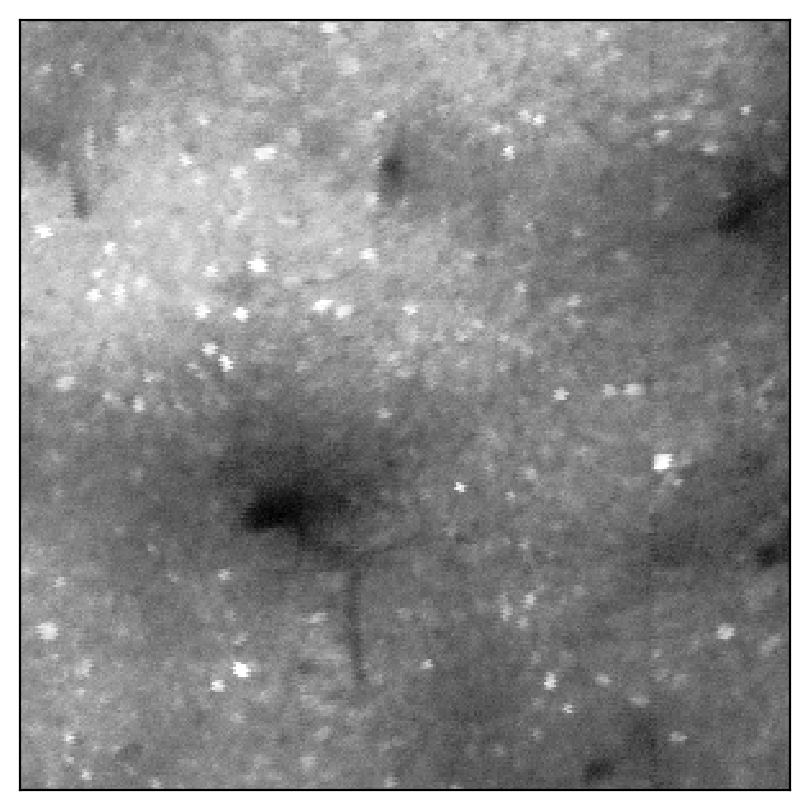

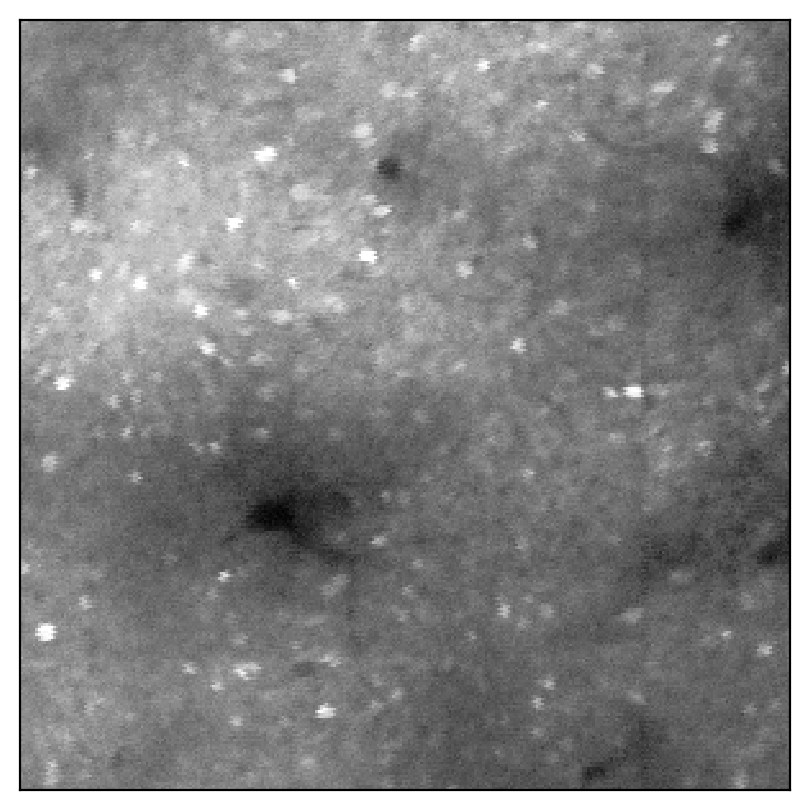

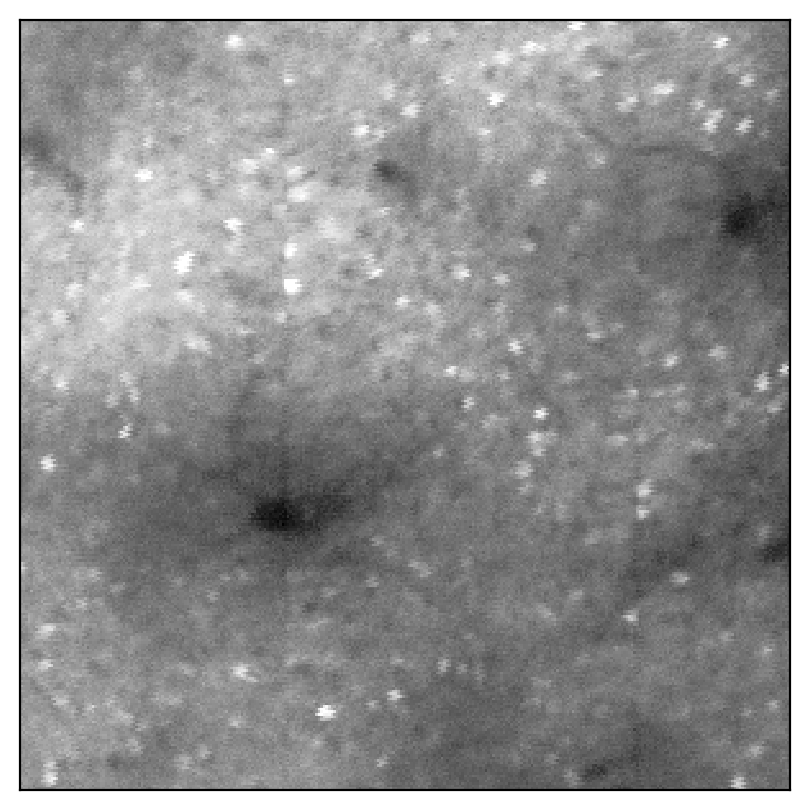

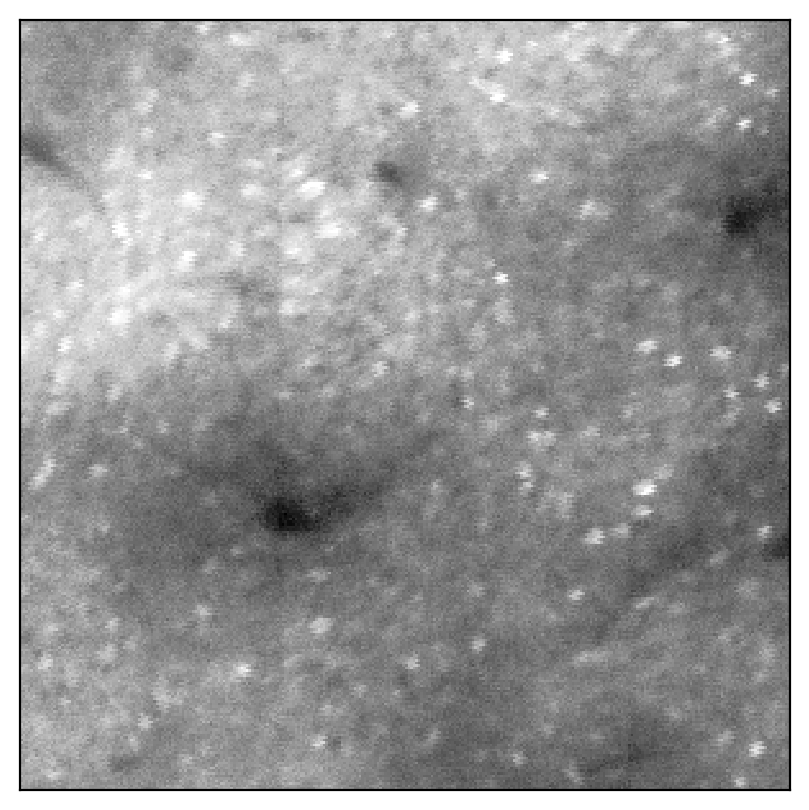

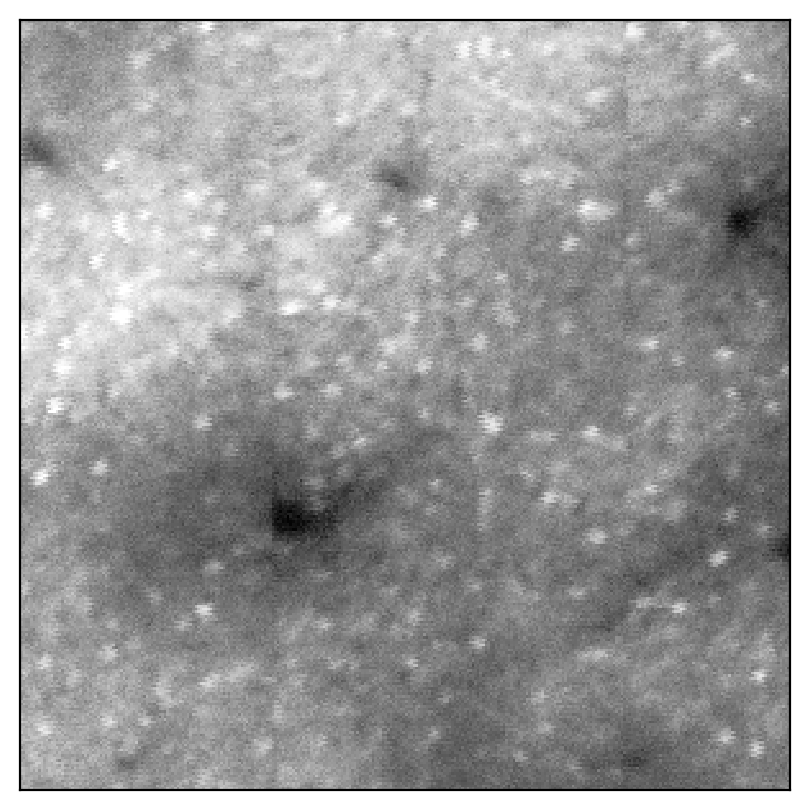

...

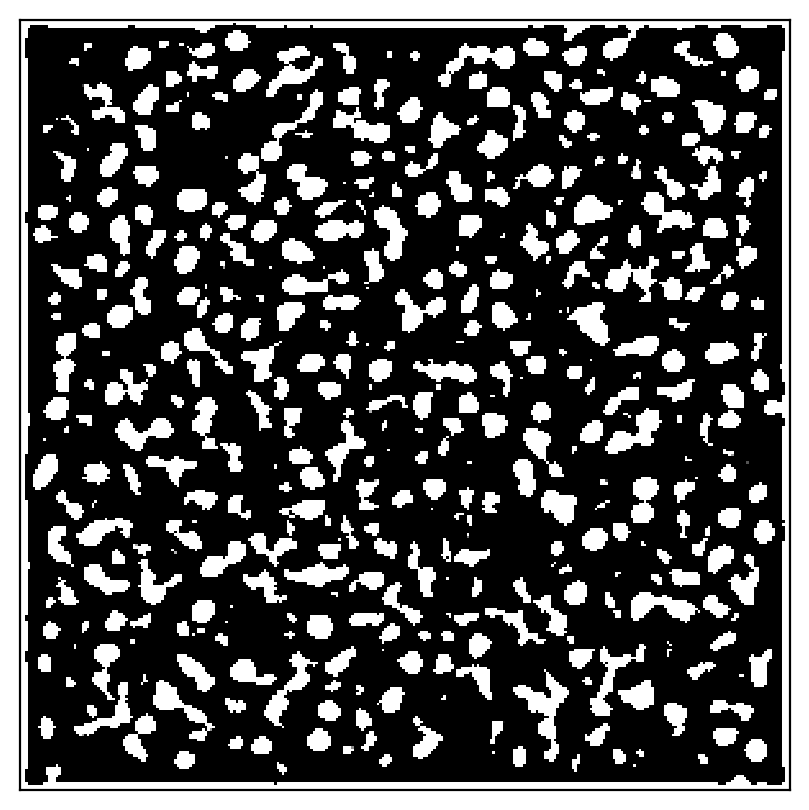

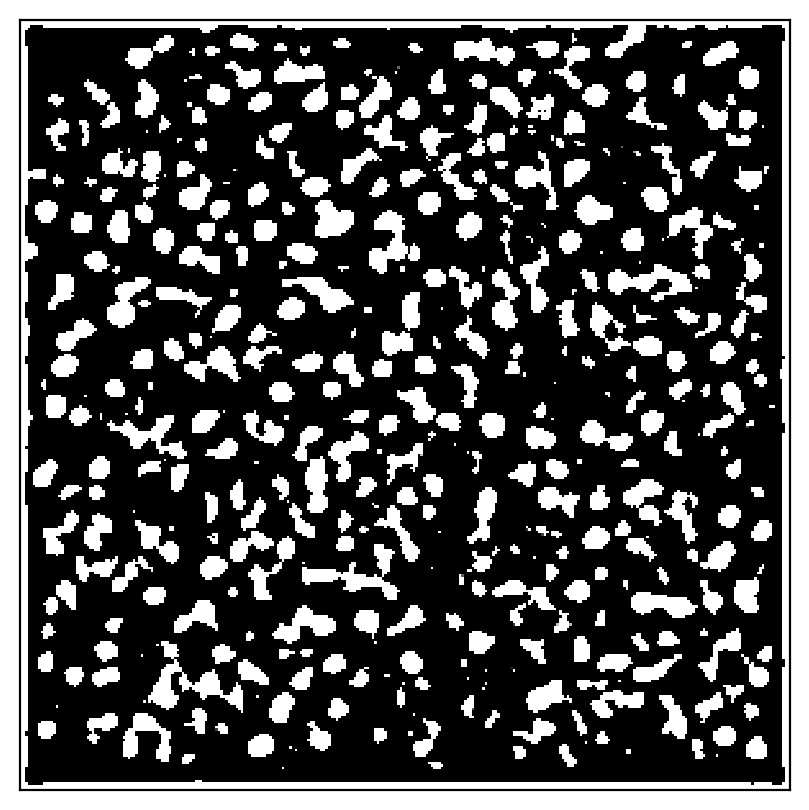

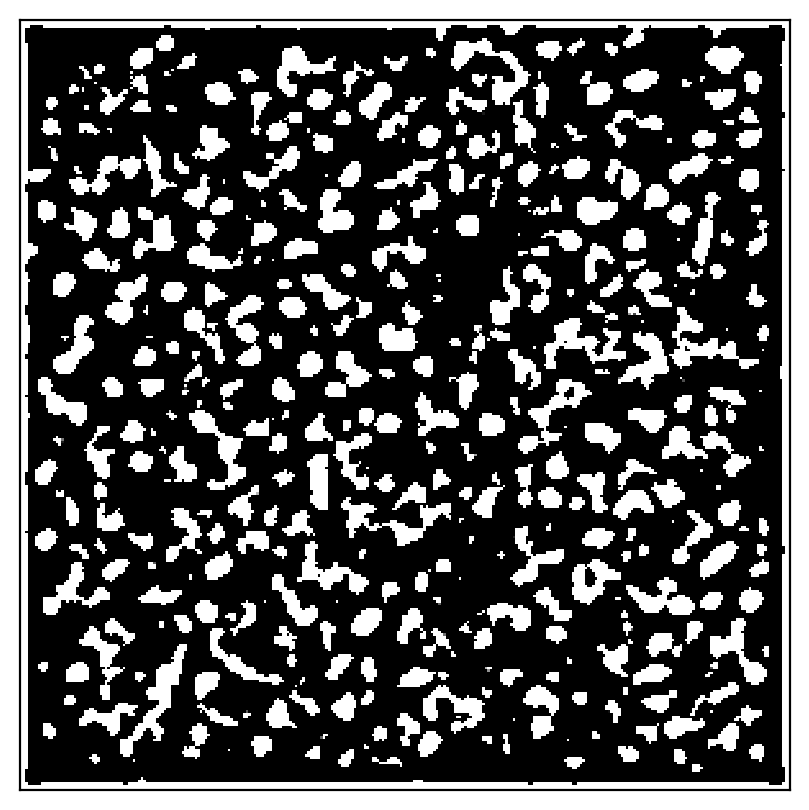

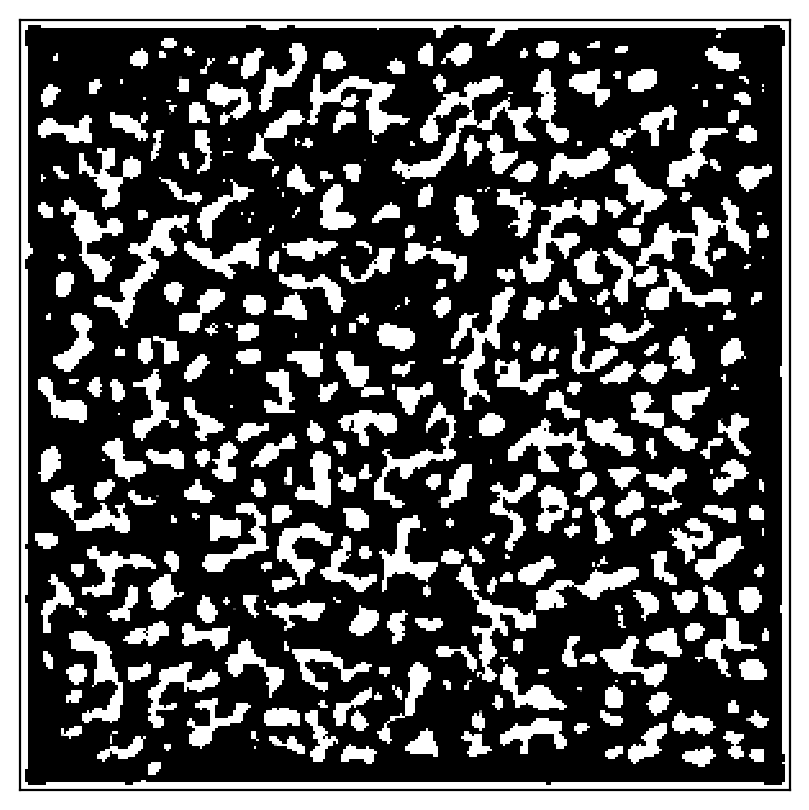

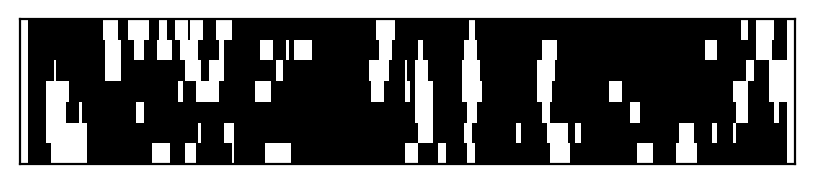

In [409]:
for sidx, step in enumerate(steps):
    stepname = names[sidx]

    for plane_idx in range(std_mov.shape[0]):
        filename = f'plane{plane_idx:02d}-step-{sidx}-{stepname}.svg'
        filepath = os.path.join(fdir, filename)

        f,ax = plt.subplots(figsize=(5,5), dpi=200)
        if stepname == 'vmap_thresh':
            tfu.show_tif(step[plane_idx], ax=ax, vminmax=(0.0002, 0.00021))
        else:
            pctile = (0,99.9)
            tfu.show_tif(step[plane_idx], ax=ax, vminmax_percentile=pctile)
        plt.savefig(filepath, bbox_inches='tight', pad_inches=0)
        # break
    # break
    
    f,ax = plt.subplots(figsize=(5,2),dpi=200)
    if stepname == 'vmap_thresh':
        tfu.show_tif(step[:,150], ax=ax, vminmax=(0.0002, 0.00021), px_py = (2.5,20))
    else:
        step_eq = (step.copy() - n.percentile(step, 1, axis=(1,2), keepdims=True))
        step_eq /= n.percentile(step_eq,100,axis=(1,2), keepdims=True)
        # step_eq 
        tfu.show_tif(step_eq[:,150], ax=ax,  vminmax = (n.percentile(step_eq, 0), n.percentile(step_eq, 99.9)), px_py = (2.5,20))
    plt.savefig(os.path.join(fdir, f'zstack-step-{sidx}-{stepname}.svg'), bbox_inches='tight', pad_inches=0)
        # break

(<Figure size 2000x400 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

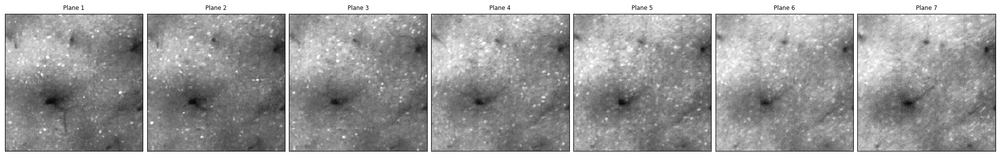

In [363]:
tfu.show_tif_all_planes(mov.std(axis=1), ncols=7, figsize=(20,4), vminmax_percentile=(0,99.9))

(<Figure size 2000x400 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

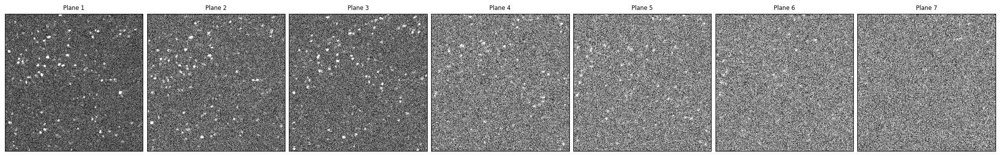

In [259]:
tfu.show_tif_all_planes(mov_norm.std(axis=1), ncols=7, figsize=(20,4))

(<Figure size 2000x400 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

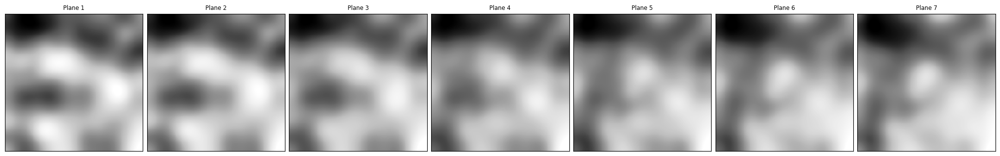

In [263]:
tfu.show_tif_all_planes(np_filt.std(axis=0), ncols=7, figsize=(20,4))

(<Figure size 2000x400 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

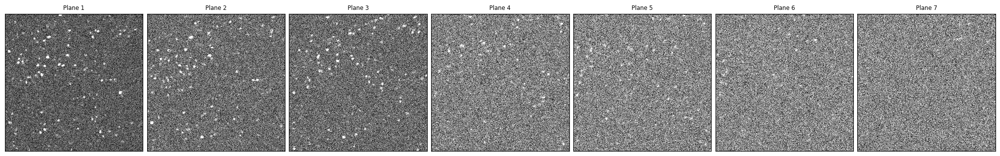

In [264]:
tfu.show_tif_all_planes(mov_sub.std(axis=0), ncols=7, figsize=(20,4))

(<Figure size 2000x400 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

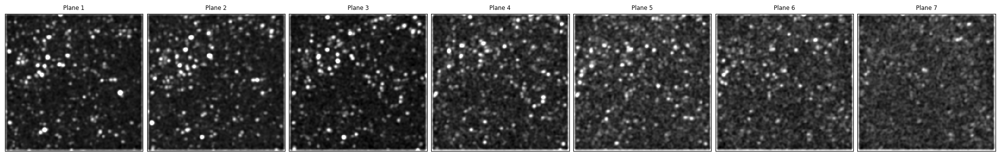

In [292]:
tfu.show_tif_all_planes(stdmap, ncols=7, figsize=(20,4), vminmax_percentile=(0,99.5))

(<Figure size 2000x400 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

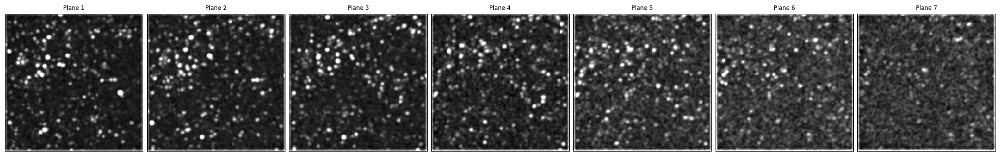

In [352]:
tfu.show_tif_all_planes(vmap, ncols=7, figsize=(20,4), vminmax_percentile=(0,99.5))

(<Figure size 2000x400 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

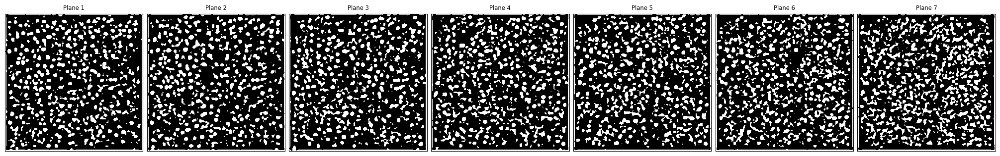

In [350]:
tfu.show_tif_all_planes(vmap_thresh, ncols=7, figsize=(20,4), vminmax=(0.0002,0.00021))

(<Figure size 800x600 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

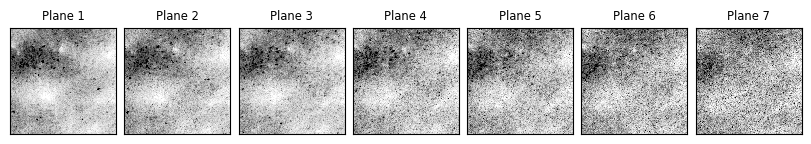

In [152]:
tfu.show_tif_all_planes(mov_norm.min(axis=1), ncols=7)

(<Figure size 800x600 with 7 Axes>,
 [array([<Axes: title={'center': 'Plane 1'}>,
         <Axes: title={'center': 'Plane 2'}>,
         <Axes: title={'center': 'Plane 3'}>,
         <Axes: title={'center': 'Plane 4'}>,
         <Axes: title={'center': 'Plane 5'}>,
         <Axes: title={'center': 'Plane 6'}>,
         <Axes: title={'center': 'Plane 7'}>], dtype=object)])

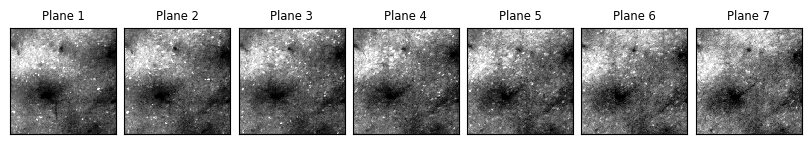

In [18]:
tfu.show_tif_all_planes(img, ncols=7)

In [90]:
%%time
job.params['voxel_size_um'] = (20, 2.5, 2.5)
job.params['npil_filt_type'] = 'unif'
job.params['npil_filt_xy_um'] = 200

job.params['cell_filt_type'] = 'gaussian'
job.params['cell_filt_xy_um'] = 5
job.params['sdnorm_exp'] = 0.85
job.params['intensity_thresh'] = 0.1 # original run with 0.1
job.params['standard_vmap'] = True
corr_map_sd1 = job.calculate_corr_map(iter_limit=5)

      Found dir /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/corrmap
      Updating self.dirs tag corrmap
      Found dir /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/mov_sub
      Updating self.dirs tag mov_sub
   Saved a copy of params at /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/corrmap
   Updated main params file
   Computing correlation map of movie with 2000 frames, volume shape: 7, 914, 699
      Running batch 1 of 5
         Timer prep completed in 1.984 sec
         Timer batch_setup completed in 0.846 sec
         Timer batch_edgecrop completed in 0.054 sec
         Timer accum_meanmeax completed in 0.710 sec
         Timer batch_rolling_mean_filt completed in 0.680 sec
         Timer batch_accum_sdmov completed in 2.116 sec
         Timer batch_norm_sdmov completed in 0.346 sec
         Loading movie into shared memory
         Timer dtu_shmem completed in 2.667 sec
         Subtracting neuropil and applying cell filters
         Timer dtu_npsub_conv3d complet

In [105]:
# corr_map = job.load_corr_map_results()['vmap']
corr_map_thresh_sd1 = ext.thresh_mask_corr_map(corr_map_sd1, thresh_window_size_pix = 51, corrmap_thresh_pct = 50)

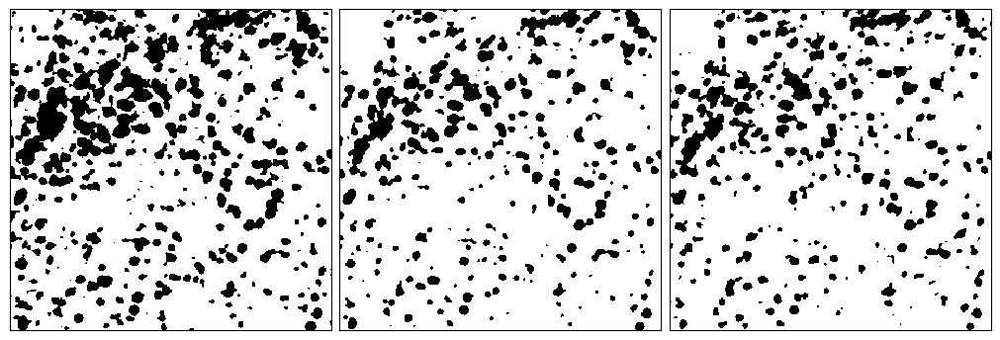

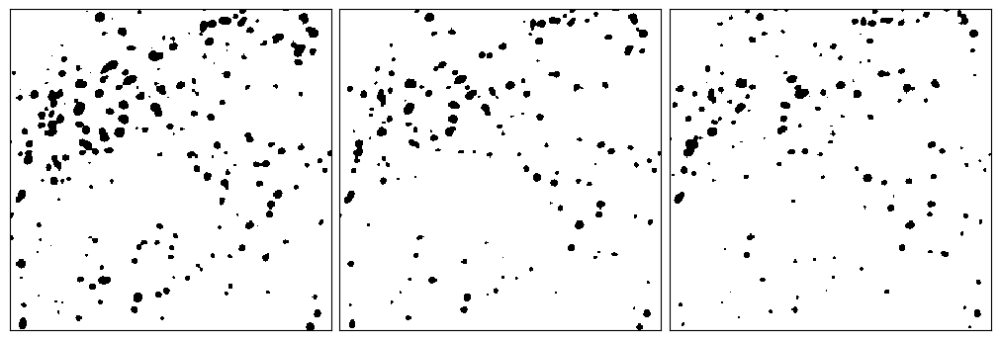

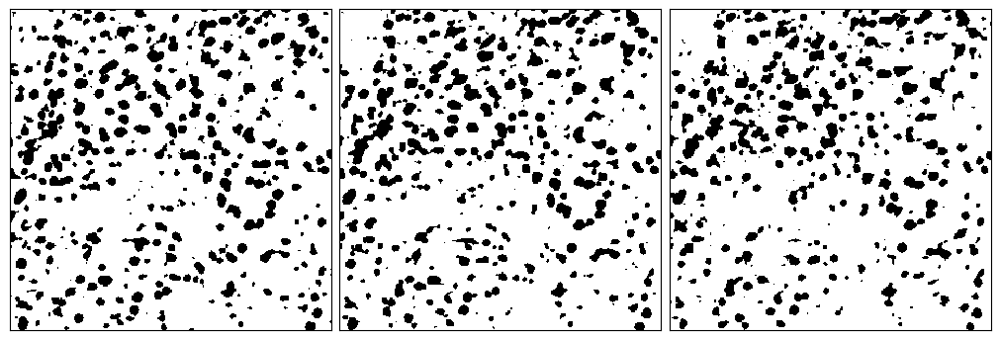

In [111]:
# [290:590, 312:612]
vthresh = .25
f,axs = tfu.show_tif_all_planes(corr_map_sd1[2:5, 290:590, 312:612,], ncols=3, figsize=(10,5), vminmax=(vthresh, vthresh+1e-5), cmap='Greys');
for ax in axs[0]: ax.set_title('')
vthresh = .30
f,axs = tfu.show_tif_all_planes(corr_map_sd1[2:5, 290:590, 312:612,], ncols=3, figsize=(10,5), vminmax=(vthresh, vthresh+1e-5), cmap='Greys');
for ax in axs[0]: ax.set_title('')
f,axs = tfu.show_tif_all_planes(corr_map_thresh_sd1[2:5, 290:590, 312:612,], ncols=3, figsize=(10,5), vminmax=(0.02, 0.02+1e-5), cmap='Greys');
for ax in axs[0]: ax.set_title('')

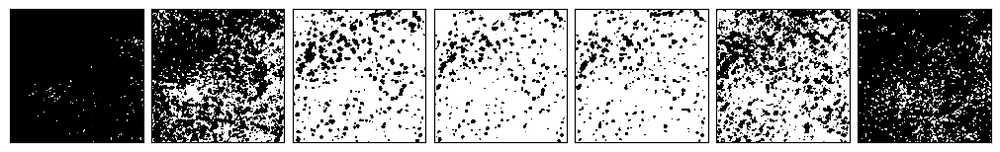

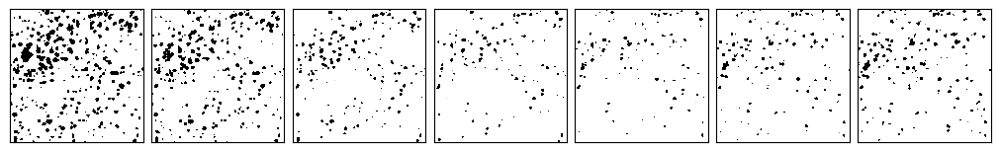

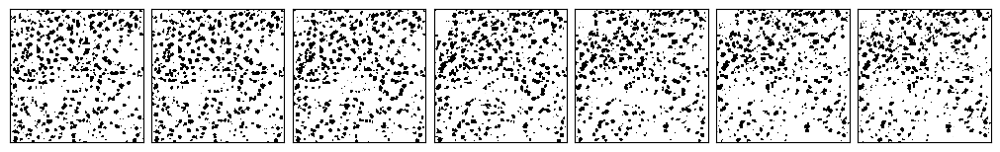

In [288]:
# [290:590, 312:612]
vthresh = .26
f,axs = tfu.show_tif_all_planes(corr_map_sd1[:, 290:590, 312:612,], ncols=7, figsize=(10,5), vminmax=(vthresh, vthresh+1e-3), cmap='Greys');
for ax in axs[0]: ax.set_title('')
vthresh = .32
f,axs = tfu.show_tif_all_planes(corr_map_sd1[:, 290:590, 312:612,], ncols=7, figsize=(10,5), vminmax=(vthresh, vthresh+1e-3), cmap='Greys');
for ax in axs[0]: ax.set_title('')
f,axs = tfu.show_tif_all_planes(corr_map_thresh_sd1[:, 290:590, 312:612,], ncols=7, figsize=(10,5), vminmax=(0.02, 0.02+1e-3), cmap='Greys');
for ax in axs[0]: ax.set_title('')

In [136]:
corr_map_thresh = corr_map_thresh_sd1

In [115]:
%%time
job.params['peak_thresh'] = 0.02
# optionally, bin the movie in time to speed up detection
# probably a good idea if you have high framerate (>5 Hz?)
job.params['detection_timebin'] = 1 

# when extending an ROI, compare its activity to its neighboring pixels
# in frames where the fluorescence is above this percentile
job.params['percentile'] = 99.0

job.params['extend_thresh'] = 0.05
job.params['activity_thresh'] = 5.0
job.params['max_iter'] = 1000
job.params['ext_subtract_iters'] = 3
job.params['n_proc_detect'] = 64
job.params['patch_size_xy'] = (250, 250)

# corr_map = job.load_corr_map_results()['vmap']
job.segment_rois(vmap=corr_map_thresh_sd1, ts = (0,2000))

      Found dir /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/segmentation
      Updating self.dirs tag segmentation
   Saved a copy of params at /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/segmentation
   Updated main params file
      Found dir /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois
      Updating self.dirs tag rois
   Saving results to /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/segmentation and /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois 
dict_keys(['max_img', 'mean_img', 'vmap', 'all_params'])
   Detecting from patch 1 / 12
      Found dir /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/segmentation/patch-0000
         Loading 3.26 GB movie to memory, shape: (2000, 7, 250, 250) 
         Loaded
         Loading movie patch to shared memory
         Loaded
      Starting extraction with peak_thresh: 0.020 and Th2: 5.000
         Iter 0000: running 64 ROIs in parallel
         Added cell 1 at 04, 021, 066, peak: 0.557, thresh: 5.000, 359 frames

'/mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois'

In [116]:
seg = job.load_segmentation_results()
shape = seg['info']['vmap'].shape
cell_id_vol, rgb_vol = ui.make_label_vols(seg['stats'], shape, lam_max=0.1, cmap='Set1')
nbui.ImageSliceViewer3D(corr_map_thresh,cmap='Greys',vminmax=(job.params['peak_thresh'],job.params['peak_thresh']*2), overlay=rgb_vol, alpha=0.5)

      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/info.npy
      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/stats.npy
      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/iscell.npy


interactive(children=(RadioButtons(description='Slice plane selection:', options=('x-y', 'y-z', 'z-x'), style=…

In [117]:
mov3d = job.get_registered_movie()[:,:1000].compute()

In [118]:
nz, nt, ny, nx = mov3d.shape

movstd = mov3d.std(axis=0)

In [119]:
meds = n.array([s['med'] for s in seg['stats']])

vpeaks = n.array([s['peak_val'] for s in seg['stats']])

In [123]:
rand_idxs = n.random.choice(n.where((vpeaks > 0.15))[0], 500, replace=False)

In [124]:
wz = 7
wxy = 50

In [131]:
acc = n.zeros((wz*2+1,wxy*2+1, wxy*2+1))
sumx = n.zeros((wz*2+1,wxy*2+1,wxy*2+1))
i = 0
for idx in rand_idxs:
    if i % 50 == 0:
        print(i  )
    i += 1
    med = meds[idx]

    mz, my, mx =med
    miny = max(0, my - wxy)
    maxy = min(ny, my + wxy)
    dyl = my - miny
    dyh = maxy - my
    
    minx = max(0, mx - wxy)
    maxx = min(nx, mx + wxy)
    dxl = mx - minx
    dxh = maxx - mx
    
    minz = max(0, mz - wz)
    maxz = min(nz, mz + wz)
    dzl = mz - minz
    dzh = maxz - mz
    
    movpix = mov3d[mz,:, my, mx].copy()
    movcube = mov3d[minz:maxz, :, miny:maxy, minx:maxx].copy()
    movcube = n.swapaxes(movcube, 0, 1).reshape(nt, -1)
    
    cubestd = movstd[minz:maxz, miny:maxy, minx:maxx].copy()
    movcube_shape = cubestd.shape
    cubestd = cubestd.flatten()
    
    movcube -= movcube.mean(axis=0)
    movpix -= movpix.mean(axis=0)
    
    corrs = ((movcube * movpix[:,n.newaxis]).mean(axis=0) / (movpix.std() * cubestd + 1e-10))
    corrs[n.abs(corrs) > 1] = 0
    acc[wz - dzl : wz + dzh, wxy - dyl : wxy + dyh, wxy - dxl : wxy + dxh] += corrs.reshape(*movcube_shape)
    sumx[wz - dzl : wz + dzh, wxy - dyl : wxy + dyh, wxy - dxl : wxy + dxh] += 1

0
50
100
150
200
250
300
350
400
450


In [132]:

from suite3d import plot_utils as plot

In [133]:
map = acc / sumx

/tmp/ipykernel_1172448/3907557198.py:1: RuntimeWarning: invalid value encountered in divide
  map = acc / sumx


In [188]:
map.shape

(15, 101, 101)

(<Figure size 600x600 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7fa592e4fcd0>)

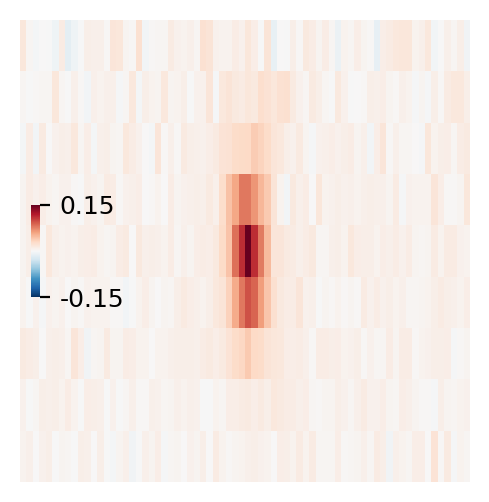

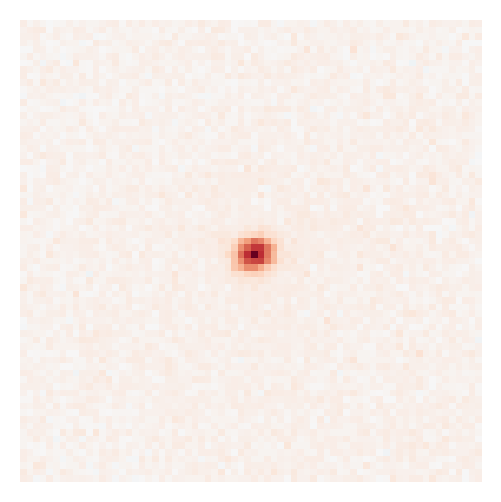

In [217]:
plot.show_img(map[wz-4:wz+5,wxy, wxy-35:wxy+35], vminmax=(-0.15,0.15), cmap='RdBu_r',px_py = (1,8), cbar=True, figsize=(3,3), dpi=200)

plot.show_img(map[7, wxy-35:wxy+35, wxy-35:wxy+35], vminmax=(-0.15,0.15), cmap='RdBu_r', figsize=(3,3), dpi=200)

/tmp/ipykernel_1172448/41942182.py:5: RuntimeWarning: Mean of empty slice
  plt.plot((n.arange(map.shape[2]) - wxy)*2.5, n.nanmean(map[wz:wz+1,wxy-pxy:wxy+pxy+1, :], axis=(0,1)), lw=3)
/tmp/ipykernel_1172448/41942182.py:22: RuntimeWarning: Mean of empty slice
  plt.plot((n.arange(map.shape[0]) - wz)*20, n.nanmean(map[:,wxy-pxy:wxy+pxy+1, wxy-pxy:wxy+pxy+1], axis=(1,2)), lw=3)


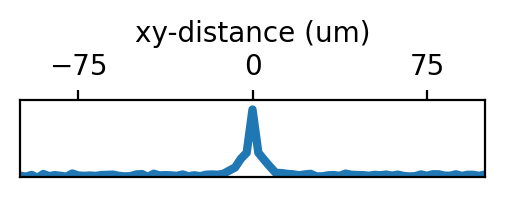

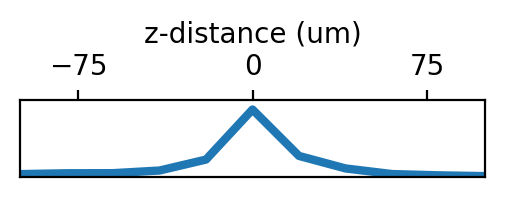

In [244]:

pxy = 0
ymax = 0.35
# pxy = 5
f,ax= plt.subplots(figsize=(3,0.5),dpi=200)
plt.plot((n.arange(map.shape[2]) - wxy)*2.5, n.nanmean(map[wz:wz+1,wxy-pxy:wxy+pxy+1, :], axis=(0,1)), lw=3)
ax.set_xlabel("xy-distance (um)")
# ax.set_ylabel("Corr.", rotation=270, labelpad=10)
ax.set_ylim(0,ymax)
ax.set_yticks([])#[0,0.04])
ax.set_xlim([-100,100])
ax.set_xticks([-75, 0, 75])

ax.xaxis.tick_top()
ax.xaxis.set_label_position('top') 
ax.yaxis.set_label_position('right') 
ax.yaxis.tick_right()




f,ax= plt.subplots(figsize=(3,0.5),dpi=200)
plt.plot((n.arange(map.shape[0]) - wz)*20, n.nanmean(map[:,wxy-pxy:wxy+pxy+1, wxy-pxy:wxy+pxy+1], axis=(1,2)), lw=3)
ax.set_xlabel("z-distance (um)")
# ax.set_ylabel("Corr.", rotation=270, labelpad=10)
ax.set_ylim(0,ymax)
ax.set_yticks([])#[0,0.04])
ax.set_xlim([-100,100])
ax.set_xticks([-75, 0, 75])

ax.xaxis.tick_top()
ax.xaxis.set_label_position('top') 
ax.yaxis.set_label_position('right') 
ax.yaxis.tick_right()

In [137]:
not_cell_flag = corr_map_thresh_sd1  > 0.015

(<Figure size 1200x900 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7fa6f047b460>)

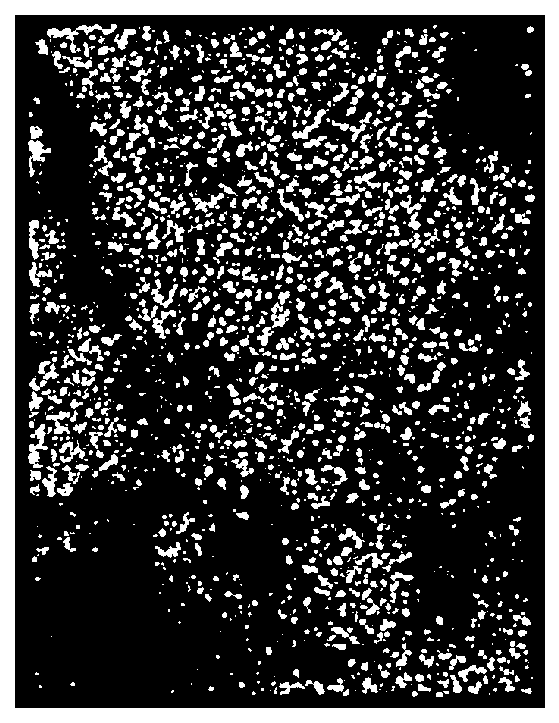

In [138]:
plot.show_img(not_cell_flag[2].astype(float))

In [139]:
not_cell_pix = n.stack(n.where(not_cell_flag)).T

In [207]:
rand_pix_idxs = n.random.choice(n.arange(not_cell_pix.shape[0]), 10000,replace=False)

In [208]:
rand_pix_idx = rand_pix_idxs[0]

In [209]:
from scipy.ndimage import gaussian_filter,uniform_filter

In [ ]:
np_acc = n.zeros((wz*2+1,wxy*2+1, wxy*2+1))
np_sumx = n.zeros((wz*2+1,wxy*2+1,wxy*2+1))
i = 0
for rand_pix_idx in rand_pix_idxs:
    if i % 100 == 0:
        print(i  )
    i += 1
    med = not_cell_pix[rand_pix_idx]

    mz, my, mx =med
    miny = max(0, my - wxy)
    maxy = min(ny, my + wxy)
    dyl = my - miny
    dyh = maxy - my
    
    minx = max(0, mx - wxy)
    maxx = min(nx, mx + wxy)
    dxl = mx - minx
    dxh = maxx - mx
    
    minz = max(0, mz - wz)
    maxz = min(nz, mz + wz)
    dzl = mz - minz
    dzh = maxz - mz
    
    cubestd = movstd[minz:maxz, miny:maxy, minx:maxx].copy()
    movcube_shape = cubestd.shape
    cubestd = cubestd.flatten()
    flag_cube = not_cell_flag[minz:maxz, miny:maxy, minx:maxx]
    movpix = mov3d[mz,:, my, mx].copy()
    movcube = mov3d[minz:maxz, :, miny:maxy, minx:maxx].copy()
    movcube = n.swapaxes(movcube, 0, 1)
    # break
    movcube[:,~flag_cube] = 0 
    # movcube = uniform_filter(movcube, (0,0,1,1))
    movcube = movcube.reshape(nt, -1)
    # movcube = movcube.reshape(nt, *movcube_shape)

    
        
    movcube -= movcube.mean(axis=0)
    movpix -= movpix.mean(axis=0)
    
    corrs = ((movcube * movpix[:,n.newaxis]).mean(axis=0) / (movpix.std() * cubestd + 1e-10))
    corrs[n.abs(corrs) > 1] = 0

    corrs = corrs.reshape(movcube_shape)
    flag_cube = not_cell_flag[minz:maxz, miny:maxy, minx:maxx]
    corrs[~flag_cube] = 0
    ind = n.ones_like(corrs)
    ind[~flag_cube] = 0
    
    np_acc[wz - dzl : wz + dzh, wxy - dyl : wxy + dyh, wxy - dxl : wxy + dxh] += corrs
    np_sumx[wz - dzl : wz + dzh, wxy - dyl : wxy + dyh, wxy - dxl : wxy + dxh] += ind

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300


In [214]:
np_map = np_acc / np_sumx

/tmp/ipykernel_1172448/2722663513.py:1: RuntimeWarning: invalid value encountered in divide
  np_map = np_acc / np_sumx


(<Figure size 600x600 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7fa5928f12b0>)

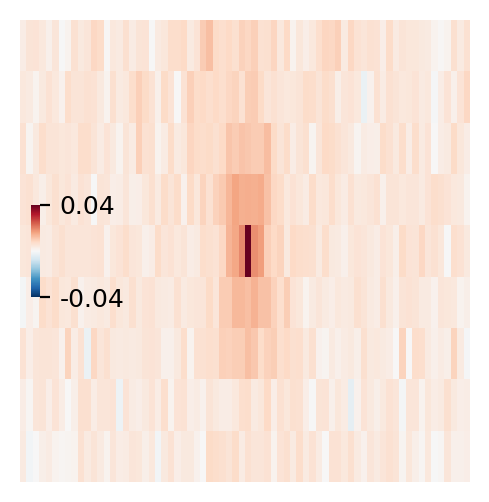

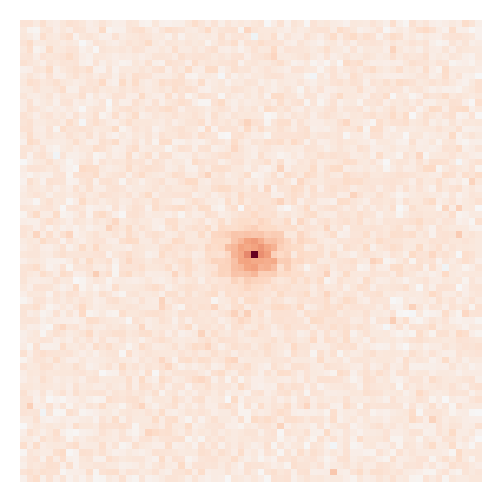

In [229]:
plot.show_img(np_map[wz-4:wz+5,wxy, wxy-35:wxy+35], vminmax=(-0.04,0.04), cmap='RdBu_r',px_py = (1,8), cbar=True, figsize=(3,3), dpi=200)

plot.show_img(np_map[7, wxy-35:wxy+35, wxy-35:wxy+35], vminmax=(-0.04,0.04), cmap='RdBu_r', figsize=(3,3), dpi=200)

/tmp/ipykernel_1172448/1635205512.py:6: RuntimeWarning: Mean of empty slice
  plt.plot((n.arange(np_map.shape[2]) - wxy)*2.5, n.nanmean(np_map[wz-pz:wz+pz+1,wxy-pxy:wxy+pxy+1, :], axis=(0,1)), lw=3)
/tmp/ipykernel_1172448/1635205512.py:23: RuntimeWarning: Mean of empty slice
  plt.plot((n.arange(np_map.shape[0]) - wz)*20, n.nanmean(np_map[:,wxy-pxy:wxy+pxy+1, wxy-pxy:wxy+pxy+1], axis=(1,2)), lw=3)


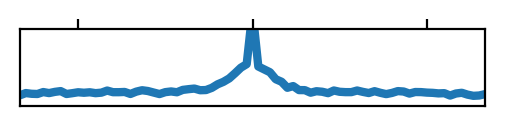

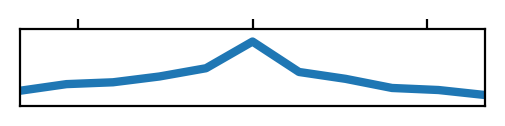

In [262]:

pxy = 3
pz = 1
ymax = 0.025
# pxy = 5
f,ax= plt.subplots(figsize=(3,0.5),dpi=200)
plt.plot((n.arange(np_map.shape[2]) - wxy)*2.5, n.nanmean(np_map[wz-pz:wz+pz+1,wxy-pxy:wxy+pxy+1, :], axis=(0,1)), lw=3)
# ax.set_xlabel("xy-distance (um)")
# ax.set_ylabel("Corr.", rotation=270, labelpad=10)
ax.set_ylim(0,ymax)
ax.set_yticks([])#[0,0.04])
ax.set_xlim([-100,100])
ax.set_xticks([-75, 0, 75], ['','',''])

ax.xaxis.tick_top()
ax.xaxis.set_label_position('top') 
ax.yaxis.set_label_position('right') 
ax.yaxis.tick_right()




f,ax= plt.subplots(figsize=(3,0.5),dpi=200)
plt.plot((n.arange(np_map.shape[0]) - wz)*20, n.nanmean(np_map[:,wxy-pxy:wxy+pxy+1, wxy-pxy:wxy+pxy+1], axis=(1,2)), lw=3)
# ax.set_xlabel("z-distance (um)")
# ax.set_ylabel("Corr.", rotation=270, labelpad=10)
ax.set_ylim(0,ymax)
ax.set_yticks([])#[0,0.04])
ax.set_xlim([-100,100])
ax.set_xticks([-75, 0, 75], ['','',''])

ax.xaxis.tick_top()
ax.xaxis.set_label_position('top') 
ax.yaxis.set_label_position('right') 
ax.yaxis.tick_right()

/tmp/ipykernel_1172448/114647694.py:3: RuntimeWarning: Mean of empty slice
  plt.plot((n.arange(map.shape[0]) - wz)*20, n.nanmean(np_map[:,wxy-pxy:wxy+pxy, wxy-pxy:wxy+pxy], axis=(1,2)))


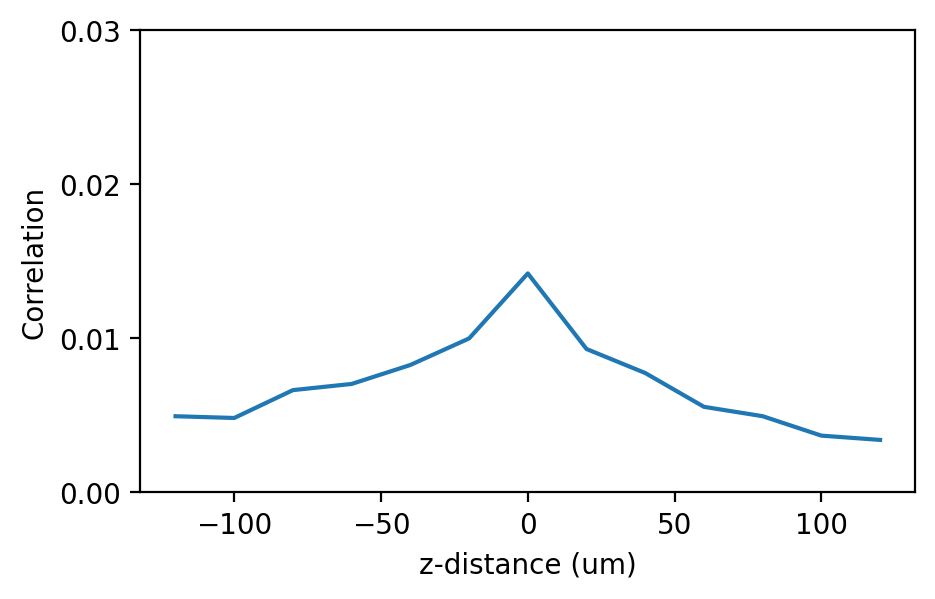

In [215]:

pxy = 5
f,ax= plt.subplots(figsize=(5,3),dpi=200)
plt.plot((n.arange(map.shape[0]) - wz)*20, n.nanmean(np_map[:,wxy-pxy:wxy+pxy, wxy-pxy:wxy+pxy], axis=(1,2)))
ax.set_xlabel("z-distance (um)")
ax.set_ylabel("Correlation")
ax.set_ylim(0,0.03)
ax.set_yticks([0,0.01,0.02, 0.03])

(<Figure size 1200x900 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7fa5a01d2c70>)

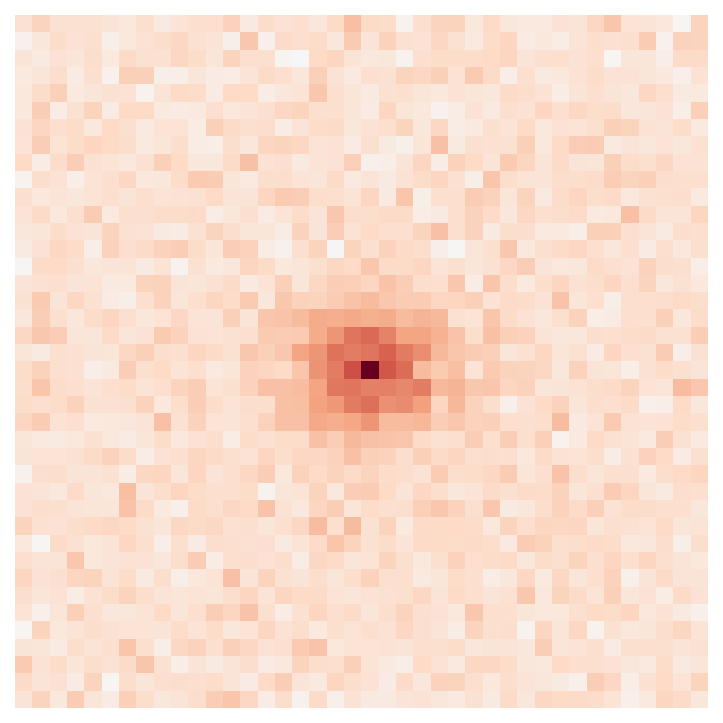

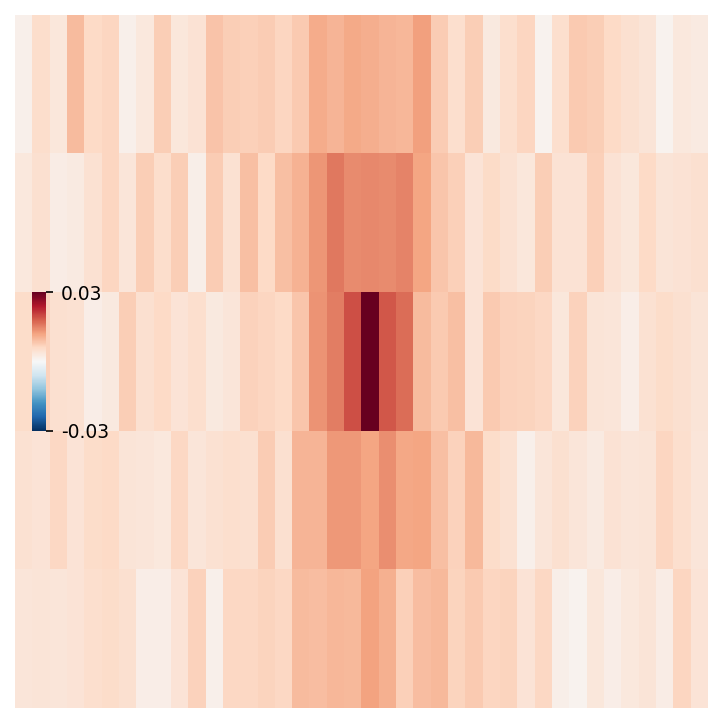

In [216]:
pxy = 20
pz = 2

vs = 0.03
plot.show_img(np_map[wz, wxy-pxy:wxy+pxy, wxy-pxy:wxy+pxy], vminmax=(-vs,vs), cmap='RdBu_r')
# plot.show_img(np_map[wz], vminmax=(-.5,.5), cmap='RdBu_r')
plot.show_img(np_map[wz-pz:wz+pz+1,wxy, wxy-pxy:wxy+pxy], vminmax=(-vs,vs), cmap='RdBu_r',px_py = (1,8), cbar=True)

(<Figure size 1200x900 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7fa591f8c0a0>)

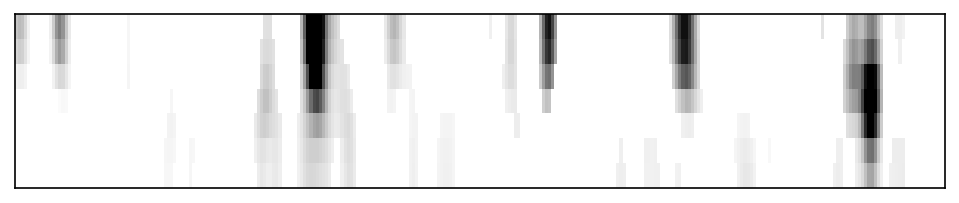

In [272]:
tfu.show_tif(corr_map_thresh[:, 310, 320:620],vminmax_percentile=(20,99), cmap='Greys', px_py = (1,8))

(<Figure size 1200x900 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7fa5a0468d30>)

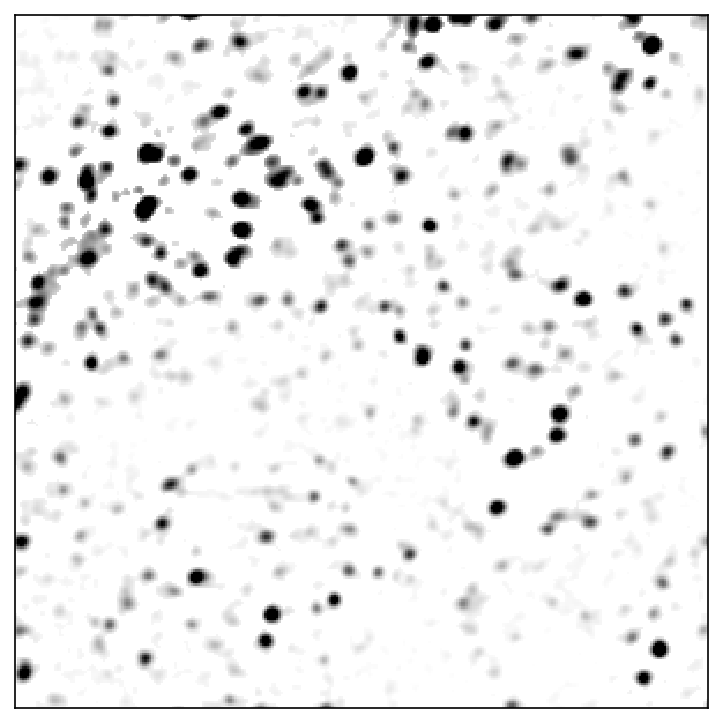

In [271]:
tfu.show_tif(corr_map_thresh[3, 300:600, 320:620],vminmax_percentile=(20,99), cmap='Greys')

In [52]:
job.compute_npil_masks(stats_dir = job.dirs['rois'])

traces = job.extract_and_deconvolve(stats_dir=job.dirs['rois'])
job.export_results('/mnt/zeytin-f1/s3d-results/',result_dir_name='rois')#, additional_info = job.load_corr_map_results())

IOStream.flush timed out
IOStream.flush timed out


   Updated main params file
   Movie shape: (7, 2000, 914, 699)
11413
   Extracting 11413 valid cells, and saving cell flags to /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/iscell_extracted.npy
   Extracting activity
         Will extract in 4 batches of 500
Saving intermediate results to /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois
            Extracting batch 0000 of 0004
            Batch size: 8 GB
            Extracting batch 0001 of 0004
            Batch size: 8 GB
            Extracting batch 0002 of 0004
            Batch size: 8 GB
            Extracting batch 0003 of 0004
            Batch size: 8 GB
   Deconvolving
   Saving to /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois
   Created dir /mnt/zeytin-f1/s3d-results/s3d-results-SS003_2024-08-06_1-2-3-4subset to export results
      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/stats_small.npy
      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/info.npy
      

In [53]:
seg = job.load_segmentation_results()
shape = seg['info']['vmap'].shape
cell_id_vol, rgb_vol = ui.make_label_vols(seg['stats'], shape, lam_max=0.1, cmap='Set1')
nbui.ImageSliceViewer3D(corr_map_thresh,cmap='Greys',vminmax=(job.params['peak_thresh'],job.params['peak_thresh']*2), overlay=rgb_vol, alpha=0.5)

      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/info.npy
      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/stats.npy
      Loading from /mnt/md0/runs/s3d-SS003_2024-08-06_1-2-3-4subset/rois/iscell.npy


interactive(children=(RadioButtons(description='Slice plane selection:', options=('x-y', 'y-z', 'z-x'), style=…

In [119]:
reg = job.load_registration_results()

In [120]:
shifts = n.concatenate(reg['int_shift'],axis=0)
sp_shifts = n.concatenate(reg['sub_pixel_shifts'], axis=0)

(0.0, 100.0)

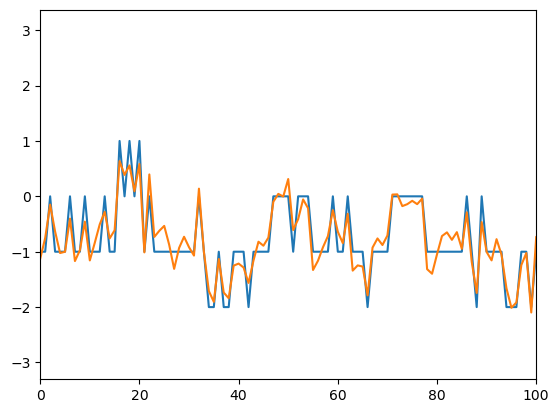

In [121]:
plt.plot(shifts[:,2])
plt.plot(sp_shifts[:,2])
plt.xlim(0,100)

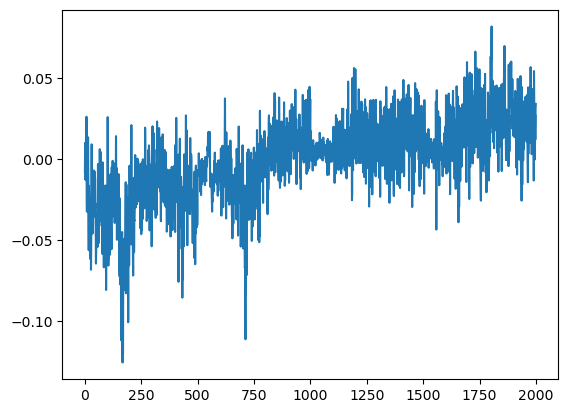

In [122]:
plt.plot(sp_shifts[:,0])